In [1]:
import sys
sys.path.append('/home/l_bechir/github/aare/build')
from _aare import *
import numpy as np
import matplotlib.pyplot as plt
import PIL
from PIL import Image
%matplotlib inline
import mpld3
mpld3.enable_notebook()
import time
from tqdm import tqdm
import boost_histogram as bh
import pickle

from tqdm import trange

# compare Pedestal

In [60]:
file = File("/home/l_bechir/tmp/testNewFW20230714/cu_half_speed_master_4.json")
p=Pedestal(400,400,1000)
for i in range(10000):
    frame = file.iread(i)
    p.push(frame)
    
    
print(np.array(p.mean()))

[[ 4407.25189492  4282.95110136  4550.69097451 ...  4262.20985901
   4280.24933654  4383.56048889]
 [11953.28110876 11778.24694457 11676.20752794 ...  6992.83460089
   7436.44641505  7429.40658894]
 [11675.22950572 11515.27522408 11428.08638579 ...  6755.15369184
   7183.1975233   7233.60160348]
 ...
 [ 7159.45721368  7134.77617143  7027.17037646 ...  4126.79080658
   4171.74766572  4287.98286878]
 [ 7301.95079689  7290.27347149  7154.93157717 ...  4087.96005992
   4376.77125286  4283.70324464]
 [ 4172.96785356  4316.48337111  4332.48478962 ...  4217.20896468
   4303.20613058  4438.38857135]]


## save pedestal

In [61]:
np.save("/home/l_bechir/tmp/results/pedestal/pedestal_mean_f0_4",np.array(p.mean()))
np.save("/home/l_bechir/tmp/results/pedestal/pedestal_var_f0_4",np.array(p.variance()))

In [62]:
Image.fromarray(np.array(p.mean())).save("/home/l_bechir/tmp/results/pedestal/pedestal_mean_f0_4.tiff")
Image.fromarray(np.array(p.variance())).save("/home/l_bechir/tmp/results/pedestal/pedestal_variance_f0_4.tiff")

## pedestal histogram

In [15]:
p=Pedestal(400,400,1000)
pedestal_hist = bh.Histogram(
    bh.axis.Regular(bins=400, start=0, stop=400), # x
    bh.axis.Regular(bins=400, start=0, stop=400), # y
    bh.axis.Regular(bins=1000, start=0 , stop =16383.0), # pedestal value
)
x=[]
for i in range(400):
    for j in range(400):
        x.append(i)
y=[]
for i in range(400):
    for j in range(400):
        y.append(j)

for i in range(10000):
    frame = file.iread(i)
    p.push(frame)
    pedestal_hist.fill(x,y,np.array(p.mean(),copy=False).flatten())
    print(i,end="\r")
    


In [28]:
with open("/home/l_bechir/tmp/results/pedestal/pedestal_histogram_1000_bins.pkl","wb") as f:
    pickle.dump(pedestal_hist,f)

In [38]:
hist1d = pedestal_hist[20,20,:]
hist1d.view().shape

(1000,)

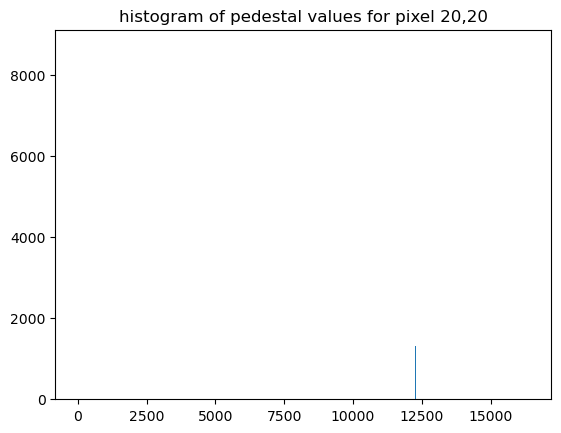

In [42]:
plt.bar(hist1d.axes[0].centers, hist1d.values(), width=hist1d.axes[0].widths);
plt.title("histogram of pedestal values for pixel 20,20")
plt.show()

### improve the start,stop and n bins of the histogram

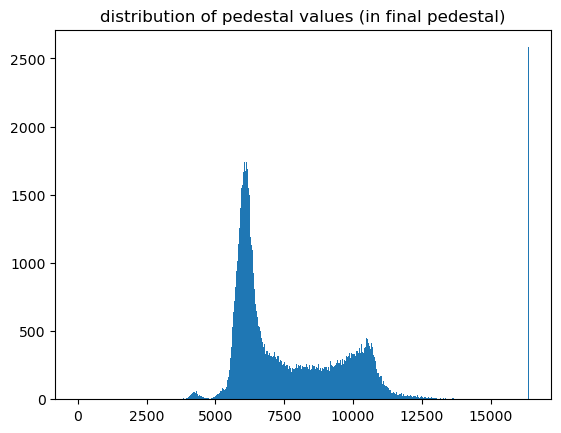

In [43]:
ped = np.array(p.mean()).flatten()
plt.hist(ped,bins=1000)
plt.title("distribution of pedestal values (in final pedestal)")
plt.show()

In [50]:
a={}
for i in ped:
    if i in a:
        a[i]+=1
    else:
        a[i]=1
m=max(a.values())

for i in a:
    if a[i] == m :
        print("mode",i)
f"pedestal max {ped.max()}"


mode 16383.0


'pedestal max 16383.0'

In [51]:
p=Pedestal(400,400,1000)
pedestal_hist2 = bh.Histogram(
    bh.axis.Regular(bins=400, start=0, stop=400), # x
    bh.axis.Regular(bins=400, start=0, stop=400), # y
    bh.axis.Regular(bins=10000, start=4000 , stop =17000.0), # pedestal value
)
x=[]
for i in range(400):
    for j in range(400):
        x.append(i)
y=[]
for i in range(400):
    for j in range(400):
        y.append(j)
        
file = File("/home/l_bechir/tmp/testNewFW20230714/cu_half_speed_master_4.json")
for i in range(10000):
    frame = file.iread(i)
    p.push(frame)
    pedestal_hist2.fill(x,y,np.array(p.mean(),copy=False).flatten())
    print(i,end="\r")
    


In [52]:
with open("/home/l_bechir/tmp/results/pedestal/pedestal_histogram_10000_bins.pkl","wb") as f:
    pickle.dump(pedestal_hist2,f)

In [58]:
hist1d2 = pedestal_hist2[20,20,:]
hist1d2.view().shape

(10000,)

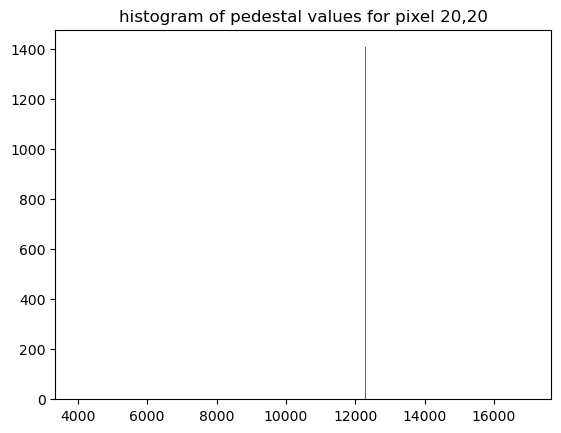

In [59]:
plt.bar(hist1d2.axes[0].centers, hist1d2.values(), width=hist1d2.axes[0].widths);
plt.title("histogram of pedestal values for pixel 20,20")
plt.show()

# run cluster finder and save clusters

In [2]:
file = File("/home/l_bechir/tmp/testNewFW20230714/cu_half_speed_master_4.json")
p=Pedestal(400,400,1000)
for i in range(10000):
    frame = file.iread(i)
    p.push(frame)
    
    
print(np.array(p.mean()))

[[ 4407.25189492  4282.95110136  4550.69097451 ...  4262.20985901
   4280.24933654  4383.56048889]
 [11953.28110876 11778.24694457 11676.20752794 ...  6992.83460089
   7436.44641505  7429.40658894]
 [11675.22950572 11515.27522408 11428.08638579 ...  6755.15369184
   7183.1975233   7233.60160348]
 ...
 [ 7159.45721368  7134.77617143  7027.17037646 ...  4126.79080658
   4171.74766572  4287.98286878]
 [ 7301.95079689  7290.27347149  7154.93157717 ...  4087.96005992
   4376.77125286  4283.70324464]
 [ 4172.96785356  4316.48337111  4332.48478962 ...  4217.20896468
   4303.20613058  4438.38857135]]


In [10]:
cluster_dict_by_frame_number={}
cluster_dict_by_index ={}
cf = ClusterFinder(3,3,5,0)
for i in range(10000):
    frame = file.iread(i)
    clusters = cf.find_clusters_without_threshold(np.array(frame,copy=True),p,False)
    cluster_dict_by_frame_number[file.frame_number(i)]=clusters
    cluster_dict_by_index[i]=clusters
    print(i,end="\r")
    
    
    
    

In [14]:
len(cluster_dict_by_frame_number)

10000

## write cluster file

In [15]:
c_file = ClusterFileV2("/home/l_bechir/tmp/results/clusters/cu_half_speed_d0_f0_4.clust","w")
i=0
for frame_number,clusters in cluster_dict_by_frame_number.items():
    c_file.write(to_clustV2(clusters,frame_number))
    print(i,end="\r")
    i+=1
    

In [18]:
c_fixle = ClusterFileV2("/home/l_bechir/tmp/results/clusters/cu_half_speed_d0_f0_4.clust","r")

b=c_fixle.read(10000)

In [40]:
len(b[0])

1251

In [22]:
c_file = ClusterFileV2("/home/l_bechir/tmp/results/clusters/cu_half_speed_d0_f0_4_by_index.clust","w")
i=0
for index,clusters in cluster_dict_by_index.items():
    c_file.write(to_clustV2(clusters,index))
    print(i,end="\r")
    i+=1
    

In [23]:
sum_arr = []
for clusters in tqdm(b):
    for cluster in clusters:
        sum_arr.append(np.array(cluster.cluster.data).sum())
len(sum_arr)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [01:21<00:00, 123.35it/s]


13786217

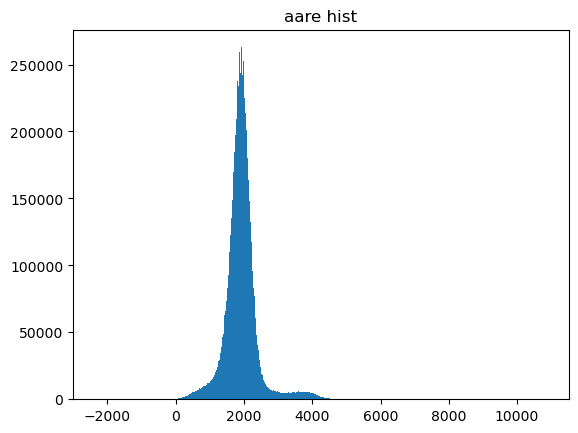

In [24]:
plt.hist(sum_arr,bins=1000)
plt.title("aare hist")
plt.show()

In [25]:
anna_cluster_file = ClusterFileV2("/mnt/sls_det_storage/moench_data/testNewFW20230714/clustNew/cu_half_speed_d0_f0_4.clust","r")
anna_clusters=(anna_cluster_file.read(10000))

In [27]:
anna_sum_arr = []
for clusters in tqdm(anna_clusters):
    for cluster in clusters:
        anna_sum_arr.append(np.array(cluster.cluster.data).sum())
len(anna_sum_arr)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [01:18<00:00, 127.00it/s]


13548170

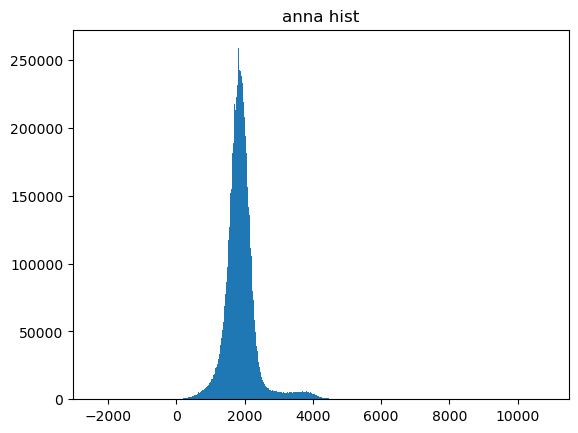

In [28]:
plt.hist(anna_sum_arr,bins=1000)
plt.title("anna hist")
plt.show()

In [32]:
print("aare: min",np.min(sum_arr), "max", np.max(sum_arr), "mean", np.mean(sum_arr))

aare: min -2351 max 10862 mean 1923.778361605653


In [31]:
print("anna: min",np.min(anna_sum_arr), "max", np.max(anna_sum_arr), "mean", np.mean(anna_sum_arr))

anna: min -2371 max 10843 mean 1886.860860618076


In [33]:
## saving cluster data as histogram

In [39]:
np.percentile(sum_arr,99.99),np.percentile(sum_arr,0.01)

(6142.0, -450.37839999999983)

In [50]:
cluster_hist = bh.Histogram(
    bh.axis.Regular(bins=400, start=0, stop=400), # x
    bh.axis.Regular(bins=400, start=0, stop=400), # y
    bh.axis.Regular(bins=1000, start=-450 , stop =6142.0), # cluster sum
)


In [51]:
for index,clusters in cluster_dict_by_index.items():
    for cluster in clusters:
        cluster_hist.fill(cluster.x,cluster.y,np.array(cluster,copy=False).sum())
    print(index,end="\r")

In [52]:
with open("/home/l_bechir/tmp/results/clusters/clusters_histogram_1000_bins.pkl","wb") as f:
    pickle.dump(cluster_hist,f)

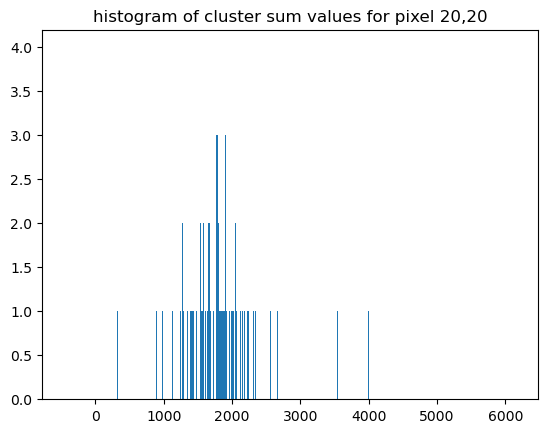

In [56]:
hist1d20_20 = cluster_hist[20,20,:]
plt.bar(hist1d20_20.axes[0].centers, hist1d20_20.values(), width=hist1d20_20.axes[0].widths*2);
plt.title("histogram of cluster sum values for pixel 20,20")
plt.show()